<a href="https://colab.research.google.com/github/AdamAly831/1116Full_Mean/blob/master/Animania.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
import matplotlib as mp
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import math
import matplotlib.patches as patches
import matplotlib.animation as animation
import matplotlib.ticker as ticker
from matplotlib.patches import Polygon
from IPython.display import HTML
mp.rcParams['animation.embed_limit'] = 2**128
from google.colab import files


https://matplotlib.org/3.1.1/api/animation_api.html

# BASIC PRINCIPLE (FuncAnimation)
The FuncAnimation class runs another given function **n** times by passing in a range of values one at a time.

ArtistAnimation is a more sophisticated animation class that uses init and blit.

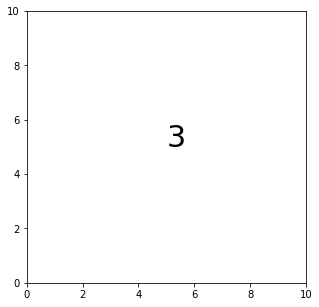

In [0]:
figure, ax = plt.subplots(figsize = (5, 5))

def name_that_frame(current_frame):
  ax.clear()
  ax.set_xlim(0, 10)
  ax.set_ylim(0, 10)
  
  ax.text(5, 5, current_frame, size = 30)

name_that_frame(3)

In [0]:
animator = animation.FuncAnimation(figure, name_that_frame, frames = range(0, 11), interval = 100, repeat = True)
HTML(animator.to_jshtml())

#GROWING DATAFRAME
LINE CHART EXAMPLE


In [0]:
data = [[2012, 12], [2013, 11], [2014, 8], [2015, 12], [2016, 10]] 
df = pd.DataFrame(data, columns = ['Year', 'Wins']) 
print(df.head())


   Year  Wins
0  2012    12
1  2013    11
2  2014     8
3  2015    12
4  2016    10


In [0]:
def print_wins(current_year):
  record = df[df['Year'] <= current_year]
  print(record)

print_wins(2015)

   Year  Wins
0  2012    12
1  2013    11
2  2014     8
3  2015    12


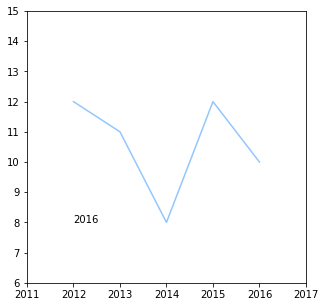

In [0]:
figure_w, ax = plt.subplots(figsize = (5, 5))

def show_wins(current_year):
  ax.clear()
  ax.set_xlim(2011, 2017)
  ax.set_ylim(6, 15)

  record = df[df['Year'] <= current_year]

  ax.plot(record['Year'], record['Wins'])

  ax.text(2012, 8, current_year, size = 10)

show_wins(2016)

In [0]:
animator = animation.FuncAnimation(figure_w, show_wins, frames = range(2010, 2017), interval = 100, repeat = True)
HTML(animator.to_jshtml())

SCATTERPLOT EXAMPLE

In [0]:
df2 = pd.DataFrame(np.random.randint(0, 100, size=(100, 2)), columns = list('AB'))
df2.head()

,A,B
0,64,72
1,19,66
2,96,92
3,30,19
4,62,75


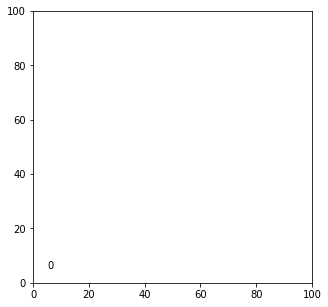

In [0]:
figure_s, ax = plt.subplots(figsize = (5, 5))

def plot_points(current_frame):
  ax.clear()
  ax.set_xlim(0, 100)
  ax.set_ylim(0, 100)

  points = df2.iloc[:current_frame]

  ax.scatter(x = points['A'], y = points['B'])

  ax.text(5, 5, current_frame, size = 10)

animator = animation.FuncAnimation(figure_s, plot_points, frames = range(0, 30), interval = 100, repeat = True)
HTML(animator.to_jshtml())


#MOVEMENT EXAMPLES
Tying anchor points to current frame

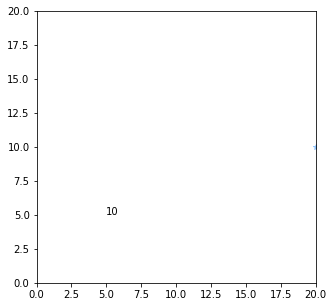

In [0]:
figure_m, ax = plt.subplots(figsize = (5, 5))

def moving_anchor(current_frame): 
  ax.clear()
  ax.set_xlim(0, 20)
  ax.set_ylim(0, 20)
 
  x_anchor_point = 0 + current_frame*2
  ax.plot(x_anchor_point, 10,'*')
  
  ax.text(5, 5, current_frame, size = 10)


moving_anchor(10)


In [0]:
animator = animation.FuncAnimation(figure_m, moving_anchor, frames = range(0, 21), interval = 100, repeat = True)
HTML(animator.to_jshtml())

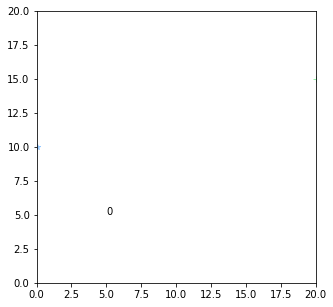

In [0]:
figure_m, ax = plt.subplots(figsize = (5, 5))

def moving_anchor2(current_frame): 
  ax.clear()
  ax.set_xlim(0, 20)
  ax.set_ylim(0, 20)
 
  x_anchor_point_r = 0 + current_frame
  x_anchor_point_l = 20 - current_frame

  ax.plot(x_anchor_point_r, 10,'*')

  ax.plot(x_anchor_point_l, 15, '+')

  ax.text(5, 5, current_frame, size = 10)

animator = animation.FuncAnimation(figure_m, moving_anchor2, frames = range(0, 21), interval = 100, repeat = True)
HTML(animator.to_jshtml())

# **MORE EXAMPLES**

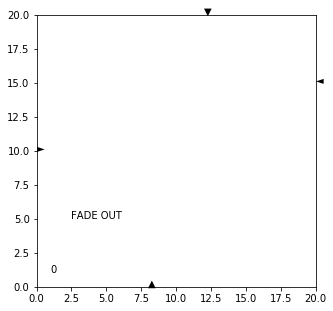

In [0]:
fig, ax = plt.subplots(figsize = (5, 5))

def examples(current_frame): 
  ax.clear()
  ax.set_xlim(0, 20)
  ax.set_ylim(0, 20)
 
  x_anchor_point = 0 + current_frame
  y_anchor_point = 0 + current_frame
  
  ax.text(x_anchor_point, 10,'►')
  ax.text(20 - x_anchor_point, 15, '◄')

  ax.text(8, y_anchor_point,'▲')
  ax.text(12, 20 - y_anchor_point, '▼')

  ax.text(2.5, 7.5, 'FADE IN', alpha = current_frame)
  ax.text(2.5, 5, 'FADE OUT', alpha = 1 - current_frame)

  ax.text(1, 1, current_frame, size = 10)

animator = animation.FuncAnimation(fig, examples, frames = range(0, 21), interval = 100, repeat = True)
HTML(animator.to_jshtml())

# **PERIODIC EXAMPLES**
Add sin/cos to periodize function

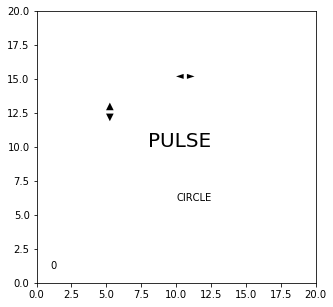

In [0]:
fig, ax = plt.subplots(figsize = (5, 5))

def examples(current_frame): 
  ax.clear()
  ax.set_xlim(0, 20)
  ax.set_ylim(0, 20)
 
  x_anchor_point = 10 + math.sin(current_frame) * 2
  y_anchor_point = 10 + math.cos(current_frame) * 2
  
  ax.text(x_anchor_point, 15,'◄ ►')

  ax.text(5, y_anchor_point,'▲\n▼')

  ax.text(math.sin(current_frame) + 10, math.cos(current_frame) + 5, "CIRCLE")

  ax.text(8, 10, 'PULSE', size = 20 + math.sin(current_frame) * 2)

  ax.text(1, 1, current_frame, size = 10)

animator = animation.FuncAnimation(fig, examples, frames = range(0, 41), interval = 100, repeat = True)
HTML(animator.to_jshtml())

# EXPORT

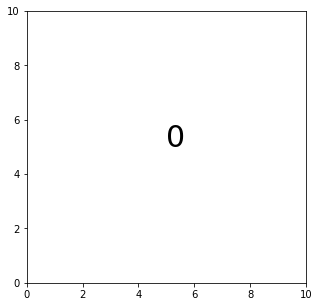

In [0]:
fig, ax = plt.subplots(figsize=(5,5))
animator = animation.FuncAnimation(fig, name_that_frame, frames=range(0, 10),interval = 100, repeat = True, repeat_delay = 10000)
animator.save('animation.mp4')
files.download('animation.mp4')

# FOR FUN
**Dynamic bar chart with Atari-quality graphics**

In [0]:
def travel(current_year):
   adj_year = current_year%10
   y_anchor = 2 - (adj_year/5)
   ax.plot([0, 10], [y_anchor - 1, y_anchor - 1], linewidth = 0.9, color = 'black', zorder = 0)
   ax.plot([0, 10], [y_anchor, y_anchor], linewidth = 0.9, color = 'black', zorder = 0)
   ax.plot([0, 10], [min(2, y_anchor + 1), min(2, y_anchor + 1)], linewidth = 0.9, color = 'black', zorder = 0)

   points1 = [(0,2), (5,2), (2.5,0), (0,0)]
   points2 = [(10,2), (5,2), (7.5,0), (10, 0)]
   polygon = plt.Polygon(points1, closed = True, color = 'green')
   polygon2 = plt.Polygon(points2, closed = True, color = 'green')

   ax.add_patch(polygon)
   ax.add_patch(polygon2)

In [0]:
def hist_height(current_year):
  x = 1.5
  if current_year > 1910:
    x = 2.5
  if current_year > 1930:
    x = 4
  if current_year > 1970:
    x = 4.5
  if current_year > 2000:
    x = 5.5
  if current_year > 2010:
    x = 8.1 
  return(x)

In [0]:
def building(height):
  face = plt.Rectangle((0,0), 1.8, height, color = 'lightgrey', zorder = 100000)
  ax.add_patch(face)
  points_side = [(1.8,0),(4.5, 1.9),(4.5, 1.9 + height/10),(1.8, height)]
  side = plt.Polygon(points_side, closed = True, color = 'grey',  zorder = 100000)
  ax.add_patch(side)
  points_top = [(0, height),(1.8, height),(4.5, 1.9 + height/10)]
  top = plt.Polygon(points_top, closed = True, color = "darkgrey",  zorder = 100000)
  if height < 2:
    ax.add_patch(top)
  
  

In [0]:
def skyline():
  for i in range (0, 20):
    x = np.random.randint(0, 9) + np.random.randint(0, 3)
    y = 2
    w = np.random.randint(20, 100)/100
    h = np.random.randint(20, 50)/100
    build = plt.Rectangle((x, y), w, h, color = "dimgrey", zorder = 1)
    ax.add_patch(build)
  for i in range (0, 20):
    x = np.random.randint(0, 9) + np.random.randint(0, 3)
    y = 2
    w = np.random.randint(20, 800)/100
    h = np.random.randint(0, 20)/100
    build = plt.Rectangle((x, y), w, h, color = "dimgrey", zorder = 1)
    ax.add_patch(build)
  sky = plt.Rectangle((0, 2), 10, 8, color = 'lightblue', zorder = 0)
  ax.add_patch(sky)
 

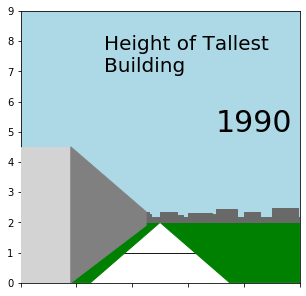

In [0]:
fig, ax = plt.subplots(figsize = (5, 5))


def metro(current_year):
  ax.clear()
  ax.set_xlim(0, 10)
  ax.set_ylim(0, 9)
  ax.set_xticklabels([])
  height = hist_height(current_year)
  travel(current_year)
  building(height)
  skyline()
  ax.text(7, 5, current_year, size = 30)
  ax.text(3, 7, 'Height of Tallest\nBuilding', size = 20)

metro(1990)

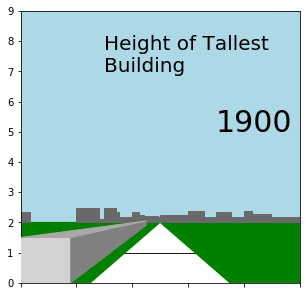

In [0]:
#animation
fig, ax = plt.subplots(figsize=(5, 5))
animator = animation.FuncAnimation(fig, metro, frames=range(1900,2030),interval = 75, repeat = True, repeat_delay = 10000)
HTML(animator.to_jshtml())

**Sine wave (from matplotlib.org)**

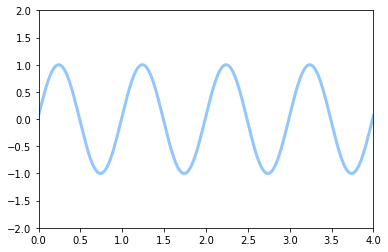

In [0]:
plt.style.use('seaborn-pastel')


fig = plt.figure()
ax = plt.axes(xlim=(0, 4), ylim=(-2, 2))
line, = ax.plot([], [], lw=3)

def init():
    line.set_data([], [])
    return line,
def animate(i):
    x = np.linspace(0, 4, 1000)
    y = np.sin(2 * np.pi * (x - 0.01 * i))
    line.set_data(x, y)
    return line,

anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=200, interval=20, blit=True)
HTML(anim.to_jshtml())

**Raindrop plot**  
(Quick and dirty not-at-all precise example)



In [0]:
df3 = pd.DataFrame(np.random.randint(40, 90, size=(100, 2)), columns = ['Lat','Long'])
df3.head()

In [0]:
#mount drive
# from google.colab import drive
# drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/gdrive


In [0]:
import matplotlib.image as mpimg
bg = mpimg.imread("/content/gdrive/My Drive/Colab Notebooks/san_andreas.png")


In [0]:
def drop0(x, y, local_frame):
  local_frame = local_frame%10
  s = min(local_frame * 50, 600)
  fade = max(0, 1 - local_frame/10)
  ax.scatter(x = x, y = y, s = s, facecolor = 'none', edgecolor = 'blue', alpha = fade)

In [0]:
def drop1(x, y, local_frame):
  local_frame = local_frame%10
  s = min(local_frame * 50, 600)
  fade = max(0, 1 - local_frame/10)
  ax.scatter(x = x, y = y, s = s, facecolor = 'none', edgecolor = 'blue', alpha = fade)
 

In [0]:
def drop2(x, y, local_frame):
  local_frame = local_frame%10
  s = min(local_frame * 50, 600)
  fade = max(0, 1 - local_frame/10)
  ax.scatter(x = x, y = y, s = s, facecolor = 'none', edgecolor = 'blue', alpha = fade)

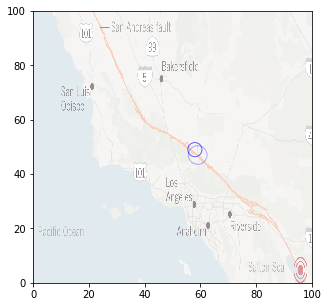

In [0]:
fig, ax = plt.subplots(figsize = (5, 5))


def rainfall(current_frame):
  ax.clear()
  ax.set_xlim(0, 100)
  ax.set_ylim(0, 100)
  ax.imshow(bg, extent=[0, 100, 0, 100], aspect  = 'auto', alpha = .5)
  index =  int(current_frame/20)
  current_loc = df3.iloc[index]
 
  x = current_loc['Lat']
  y = current_loc['Long']
  drop0(x, y, current_frame)
  x = x + 5
  y = y + 3
  drop1(x, y, current_frame - 3,)
  x = x - 1
  y = y + 2
  drop2(x, y, current_frame - 6,)


rainfall(40)

In [0]:
fig, ax = plt.subplots(figsize=(5, 5))
animator = animation.FuncAnimation(fig, rainfall, frames=range(0, 100),interval = 100, repeat = True, repeat_delay = 10000)
HTML(animator.to_jshtml())

In [0]:
fig_th, ax = plt.subplots(figsize = (25, 2))

def thanks(current_frame):
  ax.clear()
  ax.set_xlim(0, 20)
  ax.set_ylim(0, 2)

  x_anchor = max(25 - current_frame, 2)
  ax.get_xaxis().set_visible(False)
  ax.get_yaxis().set_visible(False)

  ax.text(x_anchor, 0.5, 'THANK YOU!', size = 90)

thanks(20)

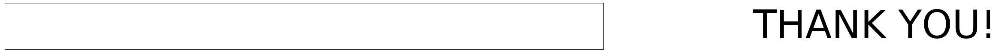

In [0]:
fig_th, ax = plt.subplots(figsize=(25, 2))
animator = animation.FuncAnimation(fig_th, thanks, frames=range(0, 30),interval = 100, repeat = True, repeat_delay = 10000)
HTML(animator.to_jshtml())